# SF crime data analysis and modeling


### Import Data and Setup Environment

In [0]:
from csv import reader
from pyspark.sql import Row 
from pyspark.sql import SparkSession
from pyspark.sql.types import *
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import warnings

import os
os.environ["PYSPARK_PYTHON"] = "python3"


In [0]:
# download data from SF gov 
import urllib.request
urllib.request.urlretrieve("https://data.sfgov.org/api/views/tmnf-yvry/rows.csv?accessType=DOWNLOAD", "/tmp/myxxxx.csv")
dbutils.fs.mv("file:/tmp/myxxxx.csv", "dbfs:/laioffer/spark_hw1/data/sf_03_18.csv")
display(dbutils.fs.ls("dbfs:/laioffer/spark_hw1/data/"))


path,name,size,modificationTime
dbfs:/laioffer/spark_hw1/data/sf_03_18.csv,sf_03_18.csv,550945238,1721131075000
dbfs:/laioffer/spark_hw1/data/sf_06_02.csv,sf_06_02.csv,550945238,1717432849000


In [0]:
data_path = "dbfs:/laioffer/spark_hw1/data/sf_03_18.csv"

In [0]:

from pyspark.sql import SparkSession
from pyspark.sql.functions import to_date, to_timestamp, hour
spark = SparkSession \
    .builder \
    .appName("crime analysis") \
    .config("spark.some.config.option", "some-value") \
    .getOrCreate()

df_opt1 = spark.read.format("csv").option("header", "true").load(data_path)

# transform 'Date' and 'Time' data to PySpark DateType and Pyspark TimestampType
df_opt1 = df_opt1.withColumn('Date', to_date(df_opt1['Date'], "MM/dd/yyyy"))
df_opt1 = df_opt1.withColumn('Time', to_timestamp(df_opt1['Time'], "HH:mm"))

display(df_opt1)
df_opt1.createOrReplaceTempView("sf_crime")

PdId,IncidntNum,Incident Code,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,location,SF Find Neighborhoods 2 2,Current Police Districts 2 2,Current Supervisor Districts 2 2,Analysis Neighborhoods 2 2,DELETE - Fire Prevention Districts 2 2,DELETE - Police Districts 2 2,DELETE - Supervisor Districts 2 2,DELETE - Zip Codes 2 2,DELETE - Neighborhoods 2 2,DELETE - 2017 Fix It Zones 2 2,Civic Center Harm Reduction Project Boundary 2 2,Fix It Zones as of 2017-11-06 2 2,DELETE - HSOC Zones 2 2,Fix It Zones as of 2018-02-07 2 2,"CBD, BID and GBD Boundaries as of 2017 2 2","Areas of Vulnerability, 2016 2 2",Central Market/Tenderloin Boundary 2 2,Central Market/Tenderloin Boundary Polygon - Updated 2 2,HSOC Zones as of 2018-06-05 2 2,OWED Public Spaces 2 2,Neighborhoods 2
4133422003074,041334220,03074,ROBBERY,"ROBBERY, BODILY FORCE",Monday,2004-11-22,1970-01-01T17:50:00.000+0000,INGLESIDE,NONE,GENEVA AV / SANTOS ST,-122.420084075249,37.7083109744362,POINT (-122.420084075249 37.7083109744362),null,null,9,null,null,null,8,309,null,null,null,null,null,null,null,null,null,null,null,null,null
5118535807021,051185358,07021,VEHICLE THEFT,STOLEN AUTOMOBILE,Tuesday,2005-10-18,1970-01-01T20:00:00.000+0000,PARK,NONE,TURK ST / STJOSEPHS AV,-120.5,90,POINT (-120.50000000000001 90),null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
4018830907021,040188309,07021,VEHICLE THEFT,STOLEN AUTOMOBILE,Sunday,2004-02-15,1970-01-01T02:00:00.000+0000,SOUTHERN,NONE,BRANNAN ST / 1ST ST,-120.5,90,POINT (-120.50000000000001 90),null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
11014543126030,110145431,26030,ARSON,ARSON,Friday,2011-02-18,1970-01-01T05:27:00.000+0000,INGLESIDE,NONE,0 Block of SANJUAN AV,-122.43622001281,37.7243766140428,POINT (-122.43622001281001 37.7243766140428),94,9,1,28,9,7,6,28861,25,null,null,null,null,null,null,1,null,null,null,null,94
10108108004134,101081080,04134,ASSAULT,BATTERY,Sunday,2010-11-21,1970-01-01T17:00:00.000+0000,SOUTHERN,NONE,400 Block of 10TH ST,-122.410541166987,37.7709130566165,POINT (-122.410541166987 37.7709130566165),32,1,10,34,8,2,9,28853,34,null,null,null,null,null,null,2,null,null,null,null,32
13027069804134,130270698,04134,ASSAULT,BATTERY,Tuesday,2013-04-02,1970-01-01T15:50:00.000+0000,TARAVAL,NONE,14TH AV / SANTIAGO ST,-122.470365997562,37.74515794927,POINT (-122.470365997562 37.74515794927),44,10,8,41,1,8,4,29491,40,null,null,null,null,null,null,1,null,null,null,null,44
17063991304134,170639913,04134,ASSAULT,BATTERY,Sunday,2017-08-06,1970-01-01T18:15:00.000+0000,SOUTHERN,NONE,800 Block of BRYANT ST,-122.40340479147905,37.775420706711,POINT (-122.40340479147905 37.775420706711),32,1,10,34,14,2,9,28853,34,null,null,null,null,null,null,2,null,null,null,null,32
16020415607020,160204156,07020,VEHICLE THEFT,STOLEN AND RECOVERED VEHICLE,Thursday,2016-03-03,1970-01-01T19:30:00.000+0000,TARAVAL,NONE,100 Block of BEPLER ST,-122.46354501681947,37.70796836450968,POINT (-122.46354501681947 37.70796836450968),null,null,null,null,null,null,null,28588,null,null,null,null,null,null,null,null,null,null,null,null,null
6068579904134,060685799,04134,ASSAULT,BATTERY,Saturday,2006-06-17,1970-01-01T03:00:00.000+0000,TARAVAL,NONE,3200 Block of SAN JOSE AV,-122.459172646607,37.7082001648459,POINT (-122.459172646607 37.7082001648459),null,null,null,null,null,null,null,28588,null,null,null,null,null,null,null,null,null,null,null,null,null
5134166327195,051341663,27195,TRESPASS,TRESPASSING,Monday,2005-11-28,1970-01-01T16:04:00.000+0000,TENDERLOIN,"ARREST, BOOKED",ELLIS ST / 5THSTNORTH ST,-120.5,90,POINT (-120.50000000000001 90),null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null


### Exploratory Data Analysis

Categorical features: Category, Descript, DayOfWeek, PdDistrict, Resolution

Numerical features: X, Y

Ignore meaningless features such as PdId, IncidntNum, etc.

We come up with problems based on these features and try to find some patterns in the time and categories of crimes.

##### First of all, we count the number of different crime categories.


In [0]:
crimeCategory = df_opt1.groupBy('Category').count().orderBy('count', ascending=False)
display(crimeCategory)

Category,count
LARCENY/THEFT,477975
OTHER OFFENSES,301874
NON-CRIMINAL,236928
ASSAULT,167042
VEHICLE THEFT,126228
DRUG/NARCOTIC,117821
VANDALISM,114718
WARRANTS,99821
BURGLARY,91067
SUSPICIOUS OCC,79087


Databricks visualization. Run in Databricks to view.

Top 3 frequently happened crimes are LARCENY/THEFT, OTHER OFFENSES, and NON-CRIMINAL.

##### Then, we count the number of crimes per district.


In [0]:
crimeDistrict = df_opt1.groupBy('PdDistrict').count().orderBy('count', ascending=False)
display(crimeDistrict)

PdDistrict,count
SOUTHERN,390692
MISSION,288985
NORTHERN,266435
CENTRAL,221923
BAYVIEW,205480
TENDERLOIN,186954
INGLESIDE,181092
TARAVAL,155461
PARK,119698
RICHMOND,112804


Databricks visualization. Run in Databricks to view.

Top 3 districts with most crime events were: SOUTHERN, MISSION, and NORTHERN.

By the way, we also explore the categories in the 3 most dangerous districts.

In [0]:
crimeSouthern = df_opt1.filter(df_opt1['PdDistrict'] == 'SOUTHERN').groupBy('Category').count().orderBy('count', ascending=False)
display(crimeSouthern)

Category,count
LARCENY/THEFT,112712
OTHER OFFENSES,50482
NON-CRIMINAL,49704
ASSAULT,28467
WARRANTS,21775
DRUG/NARCOTIC,20697
VANDALISM,17315
SUSPICIOUS OCC,12854
BURGLARY,12480
VEHICLE THEFT,11405


Databricks visualization. Run in Databricks to view.

In [0]:
crimeMission = df_opt1.filter(df_opt1['PdDistrict'] == 'MISSION').groupBy('Category').count().orderBy('count', ascending=False)
display(crimeMission)

Category,count
LARCENY/THEFT,48811
OTHER OFFENSES,46377
NON-CRIMINAL,31600
ASSAULT,25312
DRUG/NARCOTIC,18957
VEHICLE THEFT,17297
WARRANTS,15968
VANDALISM,13858
SUSPICIOUS OCC,10167
BURGLARY,9605


Databricks visualization. Run in Databricks to view.

In [0]:
crimeNorthern = df_opt1.filter(df_opt1['PdDistrict'] == 'NORTHERN').groupBy('Category').count().orderBy('count', ascending=False)
display(crimeNorthern)

Category,count
LARCENY/THEFT,80859
OTHER OFFENSES,30311
NON-CRIMINAL,26381
ASSAULT,18524
VEHICLE THEFT,14780
VANDALISM,14418
BURGLARY,14279
WARRANTS,10885
DRUG/NARCOTIC,10623
SUSPICIOUS OCC,8305


Databricks visualization. Run in Databricks to view.

In SOUTHERN, MISSION, and NORTHERN districts, most frequently happened crimes were LARCENY/THEFT, OTHER OFFENSES, NON-CRIMINAL, and ASSUALT. 

##### Moreover, we count the total number of crimes per month from 2015 to 2018, and also the total number of crime categories per month from 2015 to 2018.  

In [0]:
from pyspark.sql.functions import year, month

years = [2015, 2016, 2017, 2018]
df_opt2 = df_opt1.withColumn('Month', month(df_opt1['Date'])).withColumn('Year', year(df_opt1['Date']))
df_years = df_opt2[df_opt2.Year.isin(years)]
display(df_years)

PdId,IncidntNum,Incident Code,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,location,SF Find Neighborhoods 2 2,Current Police Districts 2 2,Current Supervisor Districts 2 2,Analysis Neighborhoods 2 2,DELETE - Fire Prevention Districts 2 2,DELETE - Police Districts 2 2,DELETE - Supervisor Districts 2 2,DELETE - Zip Codes 2 2,DELETE - Neighborhoods 2 2,DELETE - 2017 Fix It Zones 2 2,Civic Center Harm Reduction Project Boundary 2 2,Fix It Zones as of 2017-11-06 2 2,DELETE - HSOC Zones 2 2,Fix It Zones as of 2018-02-07 2 2,"CBD, BID and GBD Boundaries as of 2017 2 2","Areas of Vulnerability, 2016 2 2",Central Market/Tenderloin Boundary 2 2,Central Market/Tenderloin Boundary Polygon - Updated 2 2,HSOC Zones as of 2018-06-05 2 2,OWED Public Spaces 2 2,Neighborhoods 2,Month,Year
17063991304134,170639913,04134,ASSAULT,BATTERY,Sunday,2017-08-06,1970-01-01T18:15:00.000+0000,SOUTHERN,NONE,800 Block of BRYANT ST,-122.40340479147905,37.775420706711,POINT (-122.40340479147905 37.775420706711),32,1,10,34,14,2,9,28853,34,null,null,null,null,null,null,2,null,null,null,null,32,8,2017
16020415607020,160204156,07020,VEHICLE THEFT,STOLEN AND RECOVERED VEHICLE,Thursday,2016-03-03,1970-01-01T19:30:00.000+0000,TARAVAL,NONE,100 Block of BEPLER ST,-122.46354501681947,37.70796836450968,POINT (-122.46354501681947 37.70796836450968),null,null,null,null,null,null,null,28588,null,null,null,null,null,null,null,null,null,null,null,null,null,3,2016
15082285909262,150822859,09262,FORGERY/COUNTERFEITING,FORGERY & COUNTERFEITING (GENERAL),Saturday,2015-09-19,1970-01-01T13:33:00.000+0000,SOUTHERN,"ARREST, BOOKED",1200 Block of MARKET ST,-122.415448759562,37.778293520129,POINT (-122.41544875956198 37.778293520129),21,5,10,36,7,2,9,28852,36,null,1,null,1,null,7,2,1,1,1,35,21,9,2015
17626000906372,176260009,06372,LARCENY/THEFT,PETTY THEFT OF PROPERTY,Tuesday,2017-10-10,1970-01-01T21:00:00.000+0000,CENTRAL,NONE,OSGOOD PL / PACIFIC AV,-122.40289135143014,37.79739505508499,POINT (-122.40289135143014 37.797395055085),106,6,3,6,3,1,10,308,4,null,null,null,null,null,null,2,null,null,null,null,106,10,2017
15082286565016,150822865,65016,OTHER OFFENSES,"DRIVERS LICENSE, SUSPENDED OR REVOKED",Saturday,2015-09-19,1970-01-01T14:23:00.000+0000,NORTHERN,"ARREST, BOOKED",ELLIS ST / VANNESS AV,-122.421011927709,37.7838226942199,POINT (-122.42101192770899 37.7838226942199),20,4,11,39,7,9,11,28858,41,null,null,null,null,null,null,2,null,null,null,null,20,9,2015
15082288716110,150822887,16110,DRUG/NARCOTIC,POSSESSION OF HEROIN FOR SALES,Saturday,2015-09-19,1970-01-01T14:31:00.000+0000,TENDERLOIN,"ARREST, BOOKED",LEAVENWORTH ST / MCALLISTER ST,-122.413679376888,37.7809258336852,POINT (-122.41367937688801 37.7809258336852),21,5,10,36,7,10,9,28852,36,3,1,3,1,3,6,2,1,1,1,null,21,9,2015
15082288716120,150822887,16120,DRUG/NARCOTIC,SALE OF HEROIN,Saturday,2015-09-19,1970-01-01T14:31:00.000+0000,TENDERLOIN,"ARREST, BOOKED",LEAVENWORTH ST / MCALLISTER ST,-122.413679376888,37.7809258336852,POINT (-122.41367937688801 37.7809258336852),21,5,10,36,7,10,9,28852,36,3,1,3,1,3,6,2,1,1,1,null,21,9,2015
15082288726170,150822887,26170,OTHER OFFENSES,PROBATION VIOLATION,Saturday,2015-09-19,1970-01-01T14:31:00.000+0000,TENDERLOIN,"ARREST, BOOKED",LEAVENWORTH ST / MCALLISTER ST,-122.413679376888,37.7809258336852,POINT (-122.41367937688801 37.7809258336852),21,5,10,36,7,10,9,28852,36,3,1,3,1,3,6,2,1,1,1,null,21,9,2015
15082290628160,150822906,28160,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Saturday,2015-09-19,1970-01-01T06:30:00.000+0000,CENTRAL,NONE,1100 Block of THE EMBARCADERONORTH ST,-122.40256476079,37.8047715653509,POINT (-122.40256476079001 37.8047715653509),77,6,3,8,3,1,10,28860,6,null,null,null,null,null,null,1,null,null,null,null,77,9,2015
15025031371000,150250313,71000,NON-CRIMINAL,LOST PROPERTY,Friday,2015-03-20,1970-01-01T08:00:00.000+0000,PARK,NONE,2100 Block of FULTON ST,-122.450555872513,37.7753351819421,POINT (-122.450555872513 37.7753351819421),12,7,4,1

In [0]:
crimeYear = df_years.groupBy('Year', 'Month').count().orderBy('Year', 'Month')
display(crimeYear)

Year,Month,count
2015,1,13181
2015,2,11882
2015,3,13463
2015,4,12526
2015,5,13318
2015,6,12853
2015,7,12949
2015,8,13317
2015,9,12476
2015,10,12697


Databricks visualization. Run in Databricks to view.

In [0]:
from pyspark.sql import Window
from pyspark.sql.functions import rank
crimeCategory = df_years.groupBy('Year', 'Category').count().orderBy('count', ascending=False)
windowSpec = Window.partitionBy('Year').orderBy(crimeCategory['count'].desc())
crimeCategoryWithRank = crimeCategory.withColumn('rank', rank().over(windowSpec))
crimeCategoryTop15 = crimeCategoryWithRank.filter(crimeCategoryWithRank['rank'] <= 15)
crimeCategoryTop15 = crimeCategoryTop15.drop('rank')
crimeCategoryTop15 = crimeCategoryTop15.orderBy('count', ascending=False)
display(crimeCategoryTop15)

Year,Category,count
2017,LARCENY/THEFT,47714
2015,LARCENY/THEFT,41980
2016,LARCENY/THEFT,40365
2015,OTHER OFFENSES,20052
2016,OTHER OFFENSES,19337
2015,NON-CRIMINAL,19098
2017,OTHER OFFENSES,17890
2016,NON-CRIMINAL,17871
2017,NON-CRIMINAL,17328
2018,LARCENY/THEFT,13610


Databricks visualization. Run in Databricks to view.

Crime occurrence from 2015 to 2017 was very high, especially for LARCENY/THEFT, but there was a downward trend since 2018.

The downward trend might be due to the increase of police patrol or stronger policy. Also, LARCENY/THEFT emerged as the predominant criminal event based on the analysis, indicating a significant occurrence that warrants heightened attention from law enforcement authorities.

##### Then, we also analyze the crime occurrences over time from 2015 to 2018.

In [0]:
from pyspark.sql.functions import hour
df_years = df_years.withColumn('Hour', hour(df_years['Time']))
crimeHour = df_years.groupBy('Year', 'Hour').count().orderBy('count', ascending=False)
display(crimeHour)

Year,Hour,count
2015,18,10176
2017,18,10109
2016,18,9434
2017,12,9407
2015,19,9375
2015,12,9274
2015,17,9243
2017,19,9230
2016,17,9222
2017,17,9047


Databricks visualization. Run in Databricks to view.

From 2015 to 2018, there was a downward trend from midnight to 5 AM, and then an overall increase trend. Criminal activities exhibited significant peaks during the midday hours around 12 PM and 18 PM. It was possible that people went out for dinners or lunchs, leading to an increased movement and gathering in public. Thus, crimical activities also increased.

In [0]:
df_12PM = df_years.filter(df_years['Hour'] == 12).groupBy('Year', 'Category').count().orderBy('count', ascending=False)
display(df_12PM)

Year,Category,count
2017,LARCENY/THEFT,2788
2015,LARCENY/THEFT,2364
2016,LARCENY/THEFT,2247
2015,OTHER OFFENSES,1603
2017,OTHER OFFENSES,1491
2015,NON-CRIMINAL,1451
2016,OTHER OFFENSES,1448
2016,NON-CRIMINAL,1333
2017,NON-CRIMINAL,1232
2018,LARCENY/THEFT,766


Databricks visualization. Run in Databricks to view.

In [0]:
df_18PM = df_years.filter(df_years['Hour'] == 18).groupBy('Year', 'Category').count().orderBy('count', ascending=False)
display(df_18PM)

Year,Category,count
2017,LARCENY/THEFT,4060
2015,LARCENY/THEFT,3623
2016,LARCENY/THEFT,3245
2018,LARCENY/THEFT,1214
2015,OTHER OFFENSES,1166
2015,NON-CRIMINAL,1072
2016,OTHER OFFENSES,1068
2017,NON-CRIMINAL,1014
2017,OTHER OFFENSES,1001
2016,NON-CRIMINAL,951


Databricks visualization. Run in Databricks to view.

To be more detailed, we looked into different occurrences of crime categories at around 12 PM and 18 PM. LARCENY/THEFT, OTHER-OFFENSES, and NON-CRIMINAL were ranked as the top 3 criminal activities, and such situations became worse at around 18 PM. 

Therefore, there is a need for increased police patrol and strategic allocation of law enforcement resources during these periods to mitigate criminal events. Meanwhile, they should pay more attention to LARCENY/THEFT, OTHER-OFFENCE, and NON-CRIMINAL activities.

##### Now that we have found that LARCENY/THEFT, OTHER-OFFENSES, and NON-CRIMINAL events are the most serious problems, we are curious about resolutions of these problems.

In [0]:
resolution = df_years.groupBy('Resolution').count().orderBy('count', ascending=False)
display(resolution)

Resolution,count
NONE,361933
"ARREST, BOOKED",122009
UNFOUNDED,5102
EXCEPTIONAL CLEARANCE,1342
"ARREST, CITED",1243
PSYCHOPATHIC CASE,172
LOCATED,135
NOT PROSECUTED,51
COMPLAINANT REFUSES TO PROSECUTE,7
PROSECUTED FOR LESSER OFFENSE,3


Databricks visualization. Run in Databricks to view.

In [0]:
from pyspark.sql.functions import col
problems = ['LARCENY/THEFT', 'OTHER OFFENSES', 'NON-CRIMINAL']
sub_res = df_years.filter(col('Category').isin(problems)).groupBy('Category', 'Resolution').count().orderBy('count', ascending=False)
display(sub_res)

Category,Resolution,count
LARCENY/THEFT,NONE,137574
NON-CRIMINAL,NONE,52435
OTHER OFFENSES,"ARREST, BOOKED",37926
OTHER OFFENSES,NONE,23020
LARCENY/THEFT,"ARREST, BOOKED",5943
NON-CRIMINAL,"ARREST, BOOKED",4393
NON-CRIMINAL,UNFOUNDED,1978
OTHER OFFENSES,"ARREST, CITED",1111
OTHER OFFENSES,UNFOUNDED,564
NON-CRIMINAL,EXCEPTIONAL CLEARANCE,511


Databricks visualization. Run in Databricks to view.

It was surprising that approximately 73.6% criminal activities turned out to be unresolved from 2015 to 2018. Though 60.4% OTHER OFFENSES problems were recorded as "ARREST, BOOKED", approximately 95.8% LARCENY/THEFT activities and 88.1% NON-CRIMINAL activities were unresolved. 

Thus, police should allocate more resources (personnel, budget, technology) to resolve reported problems. It would also be better to use streamline process to reduce delay in investigations.

### ARIMA Model

Now, we use the model to forecast temporal trends and predict future patterns of crime incidents in San Francisco. As starting from 2018, there are updates and revisions of data warehouse which may cause missing or delayed data. Thus, we only consider the time series from 2003 to 2017.

#### Visualize Crime Incidences Over Time

In [0]:
df_opt3 = df_opt1.filter(year(df_opt1['Date'])!=2018).groupBy('Date').count().orderBy('Date').toPandas()
df_opt3['Date'] = pd.to_datetime(df_opt3['Date'])
df_opt3.set_index('Date', inplace=True)
df_opt3

,count
Date,
2003-01-01,582
2003-01-02,384
2003-01-03,418
2003-01-04,328
2003-01-05,367
...,...
2017-12-27,374
2017-12-28,408
2017-12-29,401


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


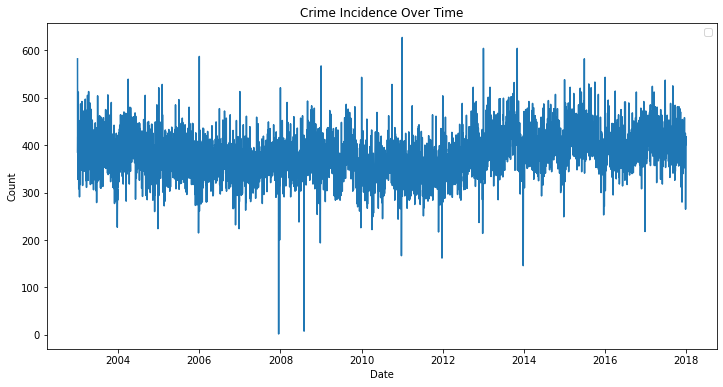

In [0]:
plt.figure(figsize=(12, 6))
plt.plot(df_opt3.index, df_opt3['count'])
plt.title('Crime Incidence Over Time')
plt.xlabel('Date')
plt.ylabel('Count')
plt.legend()
plt.show()

In [0]:
monthly = df_opt3['count'].resample('MS').mean()
monthly

Out[20]: Date
2003-01-01    398.903226
2003-02-01    406.321429
2003-03-01    400.000000
2003-04-01    408.366667
2003-05-01    388.419355
                 ...    
2017-08-01    400.903226
2017-09-01    406.800000
2017-10-01    418.387097
2017-11-01    398.000000
2017-12-01    390.806452
Freq: MS, Name: count, Length: 180, dtype: float64

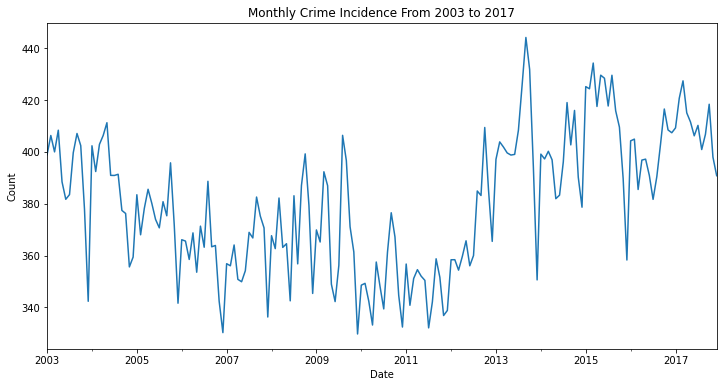

In [0]:
plt.figure(figsize=(12, 6))
monthly.plot(x='Date', y='count', kind='line')
plt.title('Monthly Crime Incidence From 2003 to 2017')
plt.xlabel('Date')
plt.ylabel('Count')
plt.show()

We can find there is a downward trend from 2003 to 2011 and an increase trend since 2011.

#### Decompose Graph

Then, we look at the time series decomposition to identify trend, seasonality, and residuals.

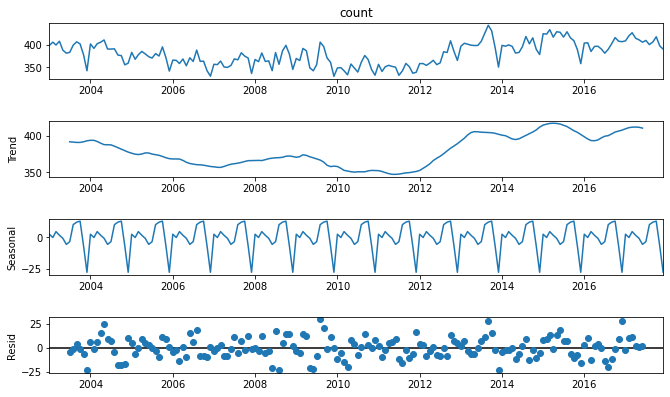

In [0]:
from statsmodels.tsa.seasonal import seasonal_decompose
decom = seasonal_decompose(monthly, model='additive', period=12)
fig = decom.plot()
fig.set_size_inches(10, 6)
plt.show()

The overall trend goes down a little bit and then goes up, but finally there is a drop in crime occurrence. There is a clear seasonal pattern. Also, residuals are approximately scattered around 0.

#### Augmented Dickey–Fuller Test (ADF Test)

In [0]:
from statsmodels.tsa.stattools import adfuller
adf = adfuller(monthly)
print(f'ADF Statistics: {adf[0]}')
print(f'P-value: {adf[1]}')
print('Critical values:')
for key, value in adf[4].items():
    print(f'    {key}: {value}')

ADF Statistics: -3.8136338332905644
P-value: 0.0027708631120328237
Critical values:
    1%: -3.4703698981001665
    5%: -2.8791138497902193
    10%: -2.576139407751488


Based on the ADF test with a p-value greater than 0.05, we can conclude that the time series is non-stationary.

Then, we use the first-order differencing to achieve the potential stationary.

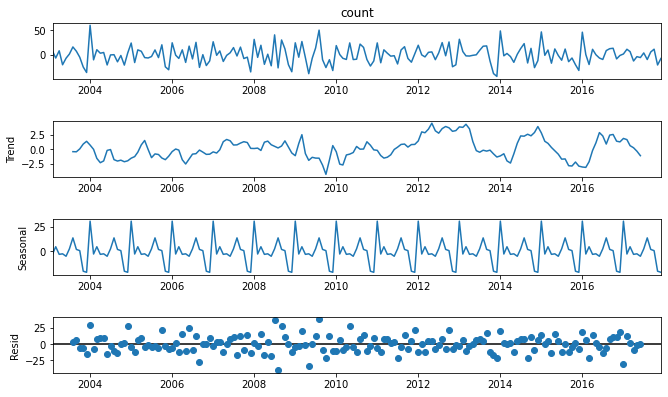

In [0]:
monthly_diff = monthly.diff().dropna()
decom_diff = seasonal_decompose(monthly_diff, model='additive', period=12)
fig = decom_diff.plot()
fig.set_size_inches(10, 6)
plt.show()

In [0]:
adf = adfuller(monthly_diff)
print(f'ADF Statistics: {adf[0]}')
print(f'P-value: {adf[1]}')
print('Critical values:')
for key, value in adf[4].items():
    print(f'    {key}: {value}')

ADF Statistics: -3.8136338332905644
P-value: 0.0027708631120328237
Critical values:
    1%: -3.4703698981001665
    5%: -2.8791138497902193
    10%: -2.576139407751488


After the first-order differencing, we got a stationary time series.

#### Build Model

In [0]:
train_size = int(len(monthly_diff) * 0.8)
train, test = monthly_diff[:train_size], monthly_diff[train_size:]

/databricks/python/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


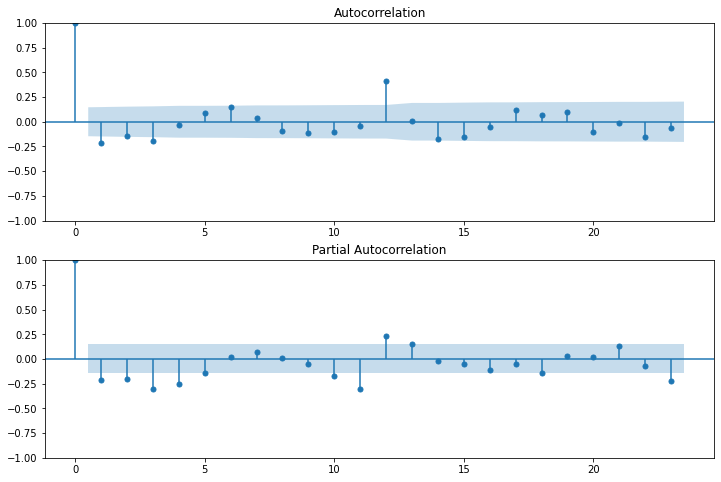

In [0]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
fig, axes = plt.subplots(2, 1, figsize=(12, 8))
plot_acf(monthly_diff, ax=axes[0])
plot_pacf(monthly_diff, ax=axes[1])
plt.show()

                                     SARIMAX Results                                      
Dep. Variable:                              count   No. Observations:                  143
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood                -534.663
Date:                            Tue, 16 Jul 2024   AIC                           1079.326
Time:                                    12:18:22   BIC                           1093.664
Sample:                                02-01-2003   HQIC                          1085.152
                                     - 12-01-2014                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3222      0.087     -3.706      0.000      -0.493      -0.152
ma.L1         -0.9999     23.800   

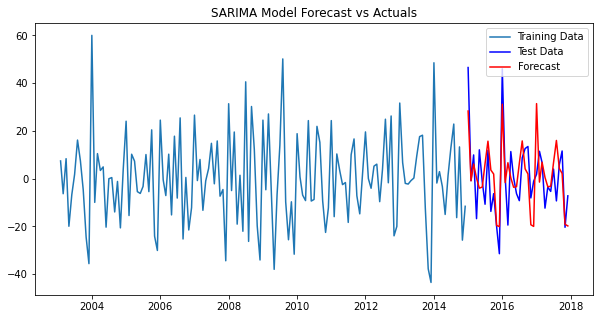

In [0]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
model_sarima = SARIMAX(train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
model_fit_sarima = model_sarima.fit()
print(model_fit_sarima.summary())

start = len(train)
end = len(train) + len(test) - 1
forecast = model_fit_sarima.predict(start=start, end=end, typ='levels')

plt.figure(figsize=(10, 5))
plt.plot(train, label='Training Data')
plt.plot(test, label='Test Data', color='blue')
plt.plot(forecast, label='Forecast', color='red')
plt.legend()
plt.title('SARIMA Model Forecast vs Actuals')
plt.show()

In [0]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
mae = mean_absolute_error(test, forecast)
mse = mean_squared_error(test, forecast)
rmse = np.sqrt(mse)

print(f'Mean Absolute Error (MAE): {mae}')
print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')

Mean Absolute Error (MAE): 10.004561237130382
Mean Squared Error (MSE): 162.42001747418738
Root Mean Squared Error (RMSE): 12.744411225089506


### Conclusions

* We analyze the SF crime data from 2003 to 2018 to make suggestions for police and law enforcement agencies. 

* Spark, Spark SQL, and data visualization are used for Online Analytical Processing(OLAP). 

* Based on my analysis, among all criminal events, theft related problems were the most serioues issue in SF, then other offenses and non-criminal problems. Criminal activities occur most freuqnetly at around 12 PM and 18 PM and in "SOUTHERN", "MISSION", and "NORTHERN" districts, which gives hints on when and where to strengthen the police power. To build on that, given that approximately 73.6% of criminal activities in San Francisco remain unresolved, it is imperative for the San Francisco Police Department to undertake comprehensive measures to enhance the effectiveness and efficiency of criminal investigations. This high percentage of unresolved cases underscores the need for strategic reforms in resource allocation, training, community engagement, technological adoption, and procedural review.

* To build on that, we did the time series analysis on data from 2003 to 2017. The ARIMA model presented to performe well and accurately capture the underlying trends and patterns with mean squared error 162.42.